# OpenAg FoodServer Data - Growing Basil 

## Characterizing basil growth in the FoodServer 2 test rack design from August 2018 - March 2019 

## Explore basil growth data 

### Experimental Information (from OpenAg_Data_Road_Map_BV_FS2.pdf):

#### Experimental Design

Complete block design over time 
<br>10 racks
<br>18 plants per rack (180 plants total)

#### Treatments

3 replications over time
<br>2 reservoir designs (75 L and 150 L)
<br>**Photoperiod:** Lights on from 6:00 AM to 10:00 PM

#### Calendar of events

**Rep 1** Aug 10 - Sept 19, 2018
<br>**Rep 2** Oct 10 - Nov 16, 2018
<br>**Rep 3** Jan 22 - Mar 1, 2019

#### Schematic of food server 2 design and rack placement (top view)

<img src="Screenshot 2019-04-20 19.52.04">

### import libraries

In [27]:
import pandas as pd
import numpy as np

import plotly_express as px

### import data

In [16]:
# import environmental data
df_env = pd.read_csv("openag-basil-viability-experiment-foodserver-2/ENVIRONMENTAL_data_BV_FS2.csv")

In [4]:
# import manual data
df_man = pd.read_excel("openag-basil-viability-experiment-foodserver-2/MANUAL_data_BV_FS2.xlsx")

### Understand base data information

In [85]:
df_env.head()

,container,crop,rep,bay,placement,date,time,temp_c,relative_humidity_%,dewpoint,date_time,month
0,FS2,basil,1.0,207,bottom,20180911,14:10:00,24.6006,58.9300,16.0403,2018-09-11 14:10:00,9
1,FS2,basil,1.0,207,bottom,20180911,14:20:00,25.0082,55.5349,15.4930,2018-09-11 14:20:00,9
2,FS2,basil,1.0,207,bottom,20180911,14:30:00,25.2441,61.0204,17.1932,2018-09-11 14:30:00,9
3,FS2,basil,1.0,207,bottom,20180911,14:40:00,25.5444,60.0820,17.2304,2018-09-11 14:40:00,9
4,FS2,basil,1.0,207,bottom,20180911,14:50:00,25.5551,55.2679,15.9263,2018-09-11 14:50:00,9


In [20]:
df_env.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 328744 entries, 0 to 328743
Data columns (total 10 columns):
container              328744 non-null object
crop                   328744 non-null object
rep                    328744 non-null float64
bay                    328744 non-null int64
placement              328744 non-null object
date                   328744 non-null int64
time                   328744 non-null object
temp_c                 328744 non-null float64
relative_humidity_%    328744 non-null float64
dewpoint               328744 non-null float64
dtypes: float64(4), int64(2), object(4)
memory usage: 25.1+ MB


In [7]:
# how many bays?
df_env["bay"].nunique()

10

In [32]:
# names of bays?
df_env["bay"].unique()

array([207, 205, 208, 206, 204, 202, 201, 209, 210, 203])

In [8]:
# how many placements?
df_env["placement"].nunique()

3

In [10]:
# over how many days?
df_env["date"].nunique()

115

In [83]:
df_env["date"].min()

20180823

In [84]:
df_env["date"].max()

20181218

In [25]:
# combine date and time and convert to datetime object
df_env["date_time"] = (df_env["date"].astype(str) + " " + df_env["time"]).astype("datetime64[ns]")

In [61]:
# make column of month number to separate data
df_env["month"] = df_env["date_time"].dt.month

### How did each bay change over time?

In [31]:
#px.scatter(df_env, x="date_time", y="relative_humidity_%", color="bay", hover_name="relative_humidity_%", facet_col="bay")

#### look at bay 207 trends


In [33]:
# dataframe for only 207
df_env_207 = df_env[df_env["bay"]==207]

In [113]:
# graph of humidity over time in bay 207
#px.line(df_env_207, x = "date_time", y = "relative_humidity_%")

In [114]:
# graph of temp over time in bay 207
#px.line(df_env_207, x = "date_time", y = "temp_c")

In [115]:
# graph of dewpoint over time in bay 207
#px.line(df_env_207, x = "date_time", y = "dewpoint")

### look at temperature changes over time in all bays

In [118]:
# graphs of temperature changes over time in all bays
'''px.line(df_env, x = "date_time", y = "temp_c", 
        #facet_row = "bay", 
        color = "bay", 
        title = "FoodServer Temperature (degrees C) in 2018 by Bay Number")'''

'px.line(df_env, x = "date_time", y = "temp_c", \n        #facet_row = "bay", \n        color = "bay", \n        title = "FoodServer Temperature (degrees C) in 2018 by Bay Number")'

initial datasets show data from Rep 1 and Rep 2 (all of 2018), but no data from Rep 3 (in 2019)
<br> Shift in temperatures changed on October 16 (not on dates defined by Reps), with no data from October 13-October 15, 2018 
<br>**Temperature deltas by FoodServer Bay:**
<br> Bays 205, 208,209,210 all had almost no temperature changes on 10/16/2018
<br> Bays 201, 202, 203, 204, 206, 207 all had large (approx 55C) temperature changes on 10/16/2018

In [45]:
# look at only bay 205
df_env_205 = df_env[df_env["bay"]==205]

In [46]:
df_env_205["date_time"].max()

Timestamp('2018-12-18 11:30:00')

In [47]:
df_env_205["date_time"].min()

Timestamp('2018-09-10 14:50:00')

In [57]:
# look at only month of nov 2018 for bay 205
df_env_205_nov = df_env_205[df_env_205["date"]==20181101]

In [58]:
# how many datapoints in nov 2018 for bay 205?
len(df_env_205_nov)

432

In [116]:
# plot temp for bay 205 in nov 2018

'''px.line(df_env_205_nov, x = "date_time", y = "temp_c", 
        #facet_row = "bay", 
        #color = "bay", 
        title = "FoodServer Temperature (degrees C) in November 2018 for Bay 205")'''

'px.line(df_env_205_nov, x = "date_time", y = "temp_c", \n        #facet_row = "bay", \n        #color = "bay", \n        title = "FoodServer Temperature (degrees C) in November 2018 for Bay 205")'

#### Temperature discrepancy in Bay 205 during first temperature change

Looks like Bay 205 has several temperatures recorded at the same time for the second part of the FoodServer Rep. Why is this? Are these recorded in different places?

### look at average high and average low temperatures in Rep 1 and Rep 2 in all bays


In [63]:
# data from september 11-october 12
df_env_septoct = df_env[df_env["date"]<=20181012]

# data from october 16-december 18
df_env_octnovdec = df_env[df_env["date"]>= 20181016]

In [65]:
df_env_octnovdec["month"].unique()

array([10, 11, 12])

In [66]:
df_env_septoct.describe()

,rep,bay,date,temp_c,relative_humidity_%,dewpoint,month
count,129962.000000,129962.000000,1.299620e+05,129962.000000,129962.000000,129962.000000,129962.000000
mean,1.358405,205.572206,2.018095e+07,24.139035,60.437900,15.856791,9.349002
std,0.300569,2.935783,4.319110e+01,2.758389,8.457974,2.832493,0.495991
min,1.000000,201.000000,2.018082e+07,17.361200,30.724100,6.925210,8.000000
25%,1.000000,203.000000,2.018092e+07,22.144600,55.855300,13.801025,9.000000
50%,1.500000,206.000000,2.018093e+07,23.782000,59.151200,14.993700,9.000000
75%,1.500000,208.000000,2.018100e+07,26.102100,64.507000,18.557650,10.000000
max,2.000000,210.000000,2.018101e+07,32.097400,93.109600,21.545000,10.000000


#### from september-october 12, temperature ranged from 17.36-32.10C; as seen on the graph, most of the bays are similar in temperature ranges
#### the dewpoint ranges from 2.83-21.55 and relative humididy % ranges from 30.72%-93.11%

In [67]:
df_env_octnovdec.describe()

,rep,bay,date,temp_c,relative_humidity_%,dewpoint,month
count,198782.000000,198782.000000,1.987820e+05,198782.000000,198782.000000,198782.000000,198782.000000
mean,2.248604,205.879858,2.018112e+07,52.692698,59.784501,16.160888,11.026290
std,0.249997,3.090119,6.730995e+01,25.897022,7.309194,2.197984,0.721942
min,2.000000,201.000000,2.018102e+07,18.755400,20.409100,0.121379,10.000000
25%,2.000000,203.000000,2.018110e+07,24.918900,55.443300,14.546200,11.000000
50%,2.000000,206.000000,2.018112e+07,70.373700,59.296200,15.562600,11.000000
75%,2.500000,209.000000,2.018120e+07,76.525800,63.782300,17.622375,12.000000
max,2.500000,210.000000,2.018122e+07,90.180800,90.820800,22.845900,12.000000


#### from october 16-december 17, the temperature ranged from 20.41-90.82C; there are two main groupings of temperatures after the temperature change, so let's look at the range by bay number
#### the dewpoint ranges from 0.12-22.85 and relative humididy % ranges from 20.41%-90.82%

In [91]:
# look at temperature ranges by bay after temperature change on oct 16
# and save as df_env_posttemp
df_env_posttemp = df_env_octnovdec.groupby("bay").agg({"temp_c" : ["max", "min", "std"]}).reset_index()
df_env_posttemp

bay   temp_c                    
            max      min        std
0  201  84.3506  68.0764   3.449272
1  202  84.9491  67.7868   3.641824
2  203  82.6648  68.1667   3.690358
3  204  84.0162  71.9119   2.868824
4  205  90.1808  21.5761  24.485917
5  206  86.8989  66.9953   4.178811
6  207  85.4703  67.9219   4.597286
7  208  32.1618  18.7554   2.700187
8  209  31.2073  18.9163   2.460226
9  210  31.2360  18.9665   2.415552

In [92]:
# look at temperature ranges by bay before temperature change on oct 16
# and save df as df_env_pretemp
df_env_pretemp = df_env_septoct.groupby("bay").agg({"temp_c" : ["max", "min", "std"]}).reset_index()
df_env_pretemp

bay   temp_c                   
            max      min       std
0  201  27.7431  19.5705  2.062908
1  202  28.6225  19.2488  2.195789
2  203  29.6521  18.8841  2.786918
3  204  28.7727  18.1084  2.372134
4  205  32.0438  18.6482  3.007070
5  206  30.7139  18.7232  2.741956
6  207  32.0974  18.1119  3.241377
7  208  31.6470  17.3612  3.193739
8  209  30.5316  18.6160  2.786106
9  210  30.6067  19.0094  2.673482

In [ ]:
# group temperatures by every 10 days to show temperature range changes over time



### make box plots of temperatures by bay before and after temperature changes

In [117]:
'''px.box(df_env, x="bay", y="temp_c", color = "bay", 
       title = "Temperature Ranges in MIT OpenAg FoodServer September 11-December 18, 2018",
       animation_frame = "date", 
       animation_group = "bay", 
       range_y = [15, 85],
       range_x = [200, 211])'''

'px.box(df_env, x="bay", y="temp_c", color = "bay", \n       title = "Temperature Ranges in MIT OpenAg FoodServer September 11-December 18, 2018",\n       animation_frame = "date", \n       animation_group = "bay", \n       range_y = [15, 85],\n       range_x = [200, 211])'

In [108]:
# add week number column to group max/min temperature readings by week
df_env["week"] = df_env["date_time"].dt.week

In [109]:
df_env.head(3)

,container,crop,rep,bay,placement,date,time,temp_c,relative_humidity_%,dewpoint,date_time,month,week
0,FS2,basil,1.0,207,bottom,20180911,14:10:00,24.6006,58.9300,16.0403,2018-09-11 14:10:00,9,37
1,FS2,basil,1.0,207,bottom,20180911,14:20:00,25.0082,55.5349,15.4930,2018-09-11 14:20:00,9,37
2,FS2,basil,1.0,207,bottom,20180911,14:30:00,25.2441,61.0204,17.1932,2018-09-11 14:30:00,9,37


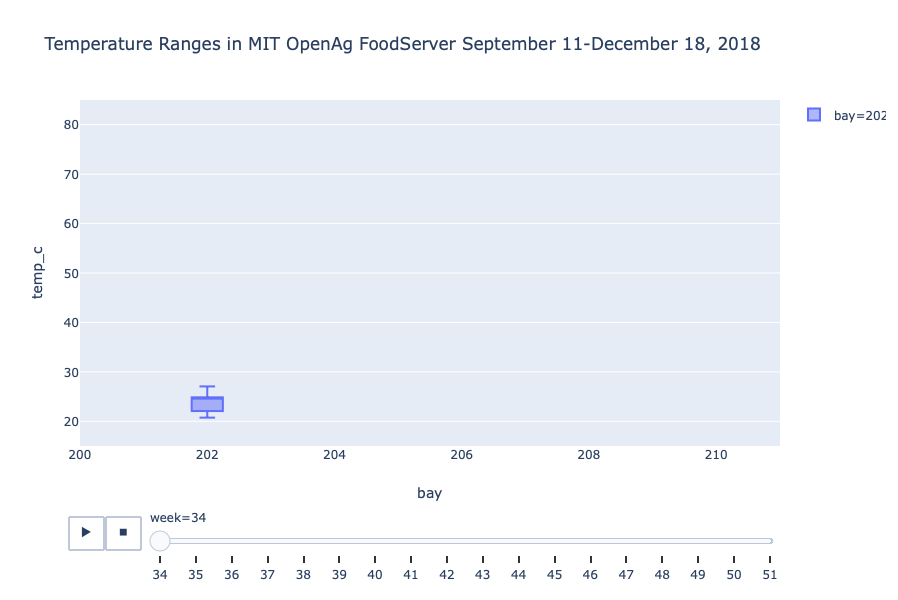

In [112]:
# box plots to show range of temperatures by week

px.box(df_env, x="bay", y="temp_c", color = "bay", 
       title = "Temperature Ranges in MIT OpenAg FoodServer September 11-December 18, 2018",
       animation_frame = "week", 
       animation_group = "bay", 
       range_y = [15, 85],
       range_x = [200, 211])